In [1]:
import os
import time
import numpy as np

import matplotlib.pyplot as plt

from tqdm import tqdm
from tensorflow.keras import layers

2024-09-28 17:46:37.931355: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-09-28 17:46:44.270193: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [9]:
batch_size = 128

train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
    'images/', label_mode = None, 
    image_size = (64, 64), batch_size = batch_size
)

train_dataset = train_dataset.map(lambda x: (x / 127.5) - 1)

Found 63565 files belonging to 1 classes.


2024-09-28 17:50:44.233793: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1960] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GPU. Follow the guide at https://www.tensorflow.org/install/gpu for how to download and setup the required libraries for your platform.
Skipping registering GPU devices...


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

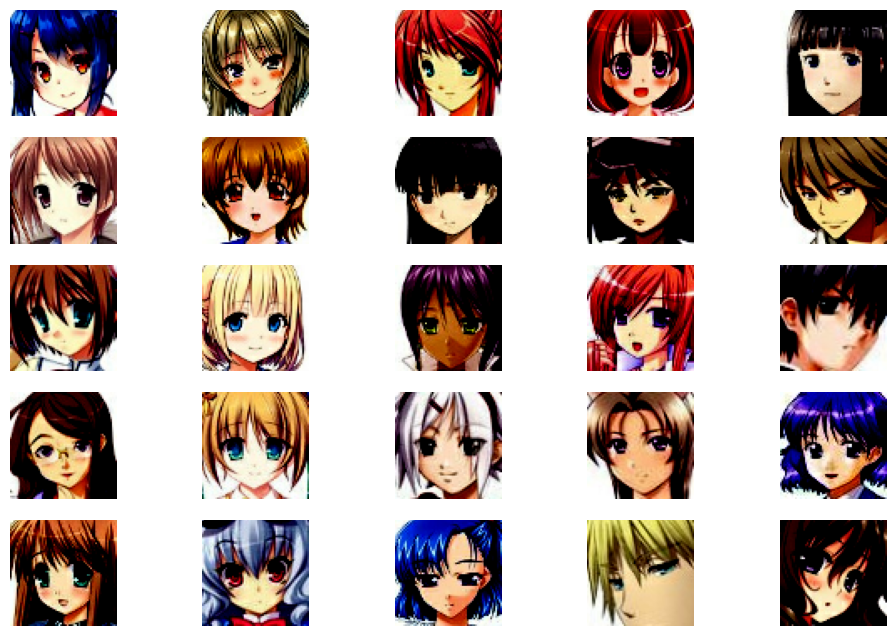

In [10]:
plt.figure(figsize = (12, 8))

for images in train_dataset.take(1):
    for i in range(25):
        ax = plt.subplot(5, 5, i + 1)
        plt.imshow(images[i].numpy())
        plt.axis('off')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Image_shape (64, 64, 3)


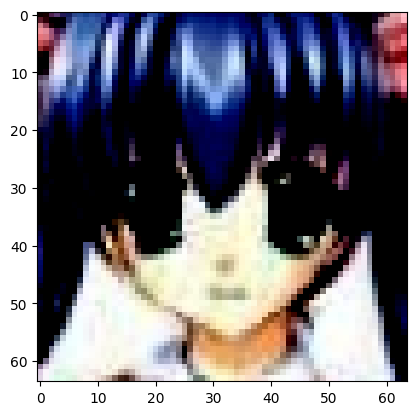

In [11]:
for batch in train_dataset:
    plt.imshow(batch[0])
    print('Image_shape', batch[0].shape)
    break

Both the generator and discriminator are defined using the Keras Sequential API.

The generator uses tf.keras.layers.Conv2DTranspose (upsampling) layers to produce an image from a seed (random noise). Start with a Dense layer that takes this seed as input, then upsample several times until you reach the desired image size of 64X64x3. Notice the tf.keras.layers.ReLU activation for each layer, except the output layer which uses tanh. All the convolution-layer weights are initialized from a zero-centered normal distribution, with a standard deviation of 0.02 as per the original paper. Blocks 2, 3, and 4 consist of a convolution layer, followed by a batch-normalization layer and an activation function, ReLU. The last block comprises no batch-normalization layer, with a sigmoid activation function.

Note that activation in final layer is tanh which outputs in the range -1 to 1. we reshape the 44256-d tensor to (Batch Size, 4, 4, 256) using layers.Reshape function.Code for GAN architecture is based on this link https://www.kaggle.com/mrigendraagrawal/introduction-to-ganime/notebook and the original paper link on which architecture is based is here-https://arxiv.org/pdf/1511.06434.pdf

## Setting up adverserial network

In [12]:
init_weights_kernel = tf.keras.initializers.RandomNormal(mean = 0.0, stddev = 0.02)

In [13]:
def generator_model():
    model = tf.keras.Sequential()

    model.add(layers.Input(shape = (100, )))
    model.add(layers.Dense(4 * 4 * 256))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    model.add(layers.Reshape((4, 4, 256)))
    
    model.add(layers.Conv2DTranspose(128, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel , use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(64, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())
    
    model.add(layers.Conv2DTranspose(32, kernel_size = 4, padding = 'same', strides = 2,
                                     kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.ReLU())

    model.add(layers.Conv2DTranspose(3, kernel_size = 4, padding = 'same', strides = 2, activation = 'tanh',
                                     kernel_initializer = init_weights_kernel, use_bias = False))
   
    
    return model

In [14]:
generator = generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 4096)              413696    
                                                                 
 batch_normalization (Batch  (None, 4096)              16384     
 Normalization)                                                  
                                                                 
 re_lu (ReLU)                (None, 4096)              0         
                                                                 
 reshape (Reshape)           (None, 4, 4, 256)         0         
                                                                 
 conv2d_transpose (Conv2DTr  (None, 8, 8, 128)         524288    
 anspose)                                                        
                                                                 
 batch_normalization_1 (Bat  (None, 8, 8, 128)         5

/home/kumar.anke/.conda/envs/ml_course_env/lib/python3.8/site-packages/keras/src/initializers/initializers.py:120: UserWarning: The initializer RandomNormal is unseeded and being called multiple times, which will return identical values each time (even if the initializer is unseeded). Please update your code to provide a seed to the initializer, or avoid using the same initializer instance more than once.
  warnings.warn(


In [15]:
noise = tf.random.normal([1, 100])

generated_image = generator(noise, training = False)

generated_image.shape

TensorShape([1, 64, 64, 3])

In [16]:
generated_image[0, :5, :5]

<tf.Tensor: shape=(5, 5, 3), dtype=float32, numpy=
array([[[-1.24437793e-04, -3.88024055e-05,  4.35822330e-05],
        [-8.59698503e-06,  1.92824191e-05, -2.12125087e-06],
        [ 7.19251693e-05,  1.08535642e-04,  1.31930283e-05],
        [-1.30334884e-05, -8.28099001e-05, -9.14929260e-05],
        [ 2.48107208e-05,  8.83537796e-05,  1.14411159e-04]],

       [[ 6.99467419e-05, -7.74251603e-05,  3.21595289e-05],
        [ 6.42452855e-04,  1.67331760e-04, -2.23403214e-04],
        [ 4.45685262e-04, -6.39276623e-05,  1.86755482e-04],
        [ 1.02075992e-05, -1.82405129e-04, -1.33593159e-04],
        [ 3.69489368e-04,  2.57082575e-05, -3.97361291e-04]],

       [[-1.77778798e-04,  4.19682146e-05, -7.02068428e-05],
        [ 1.34275120e-04,  5.84220288e-06,  3.60656239e-04],
        [ 2.87805946e-04, -1.13281727e-04, -1.82950855e-04],
        [ 1.36788294e-04,  3.83124163e-04,  2.24711504e-04],
        [-1.25617007e-04,  4.54294292e-04,  1.79665964e-04]],

       [[ 7.82198695e-05, -1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


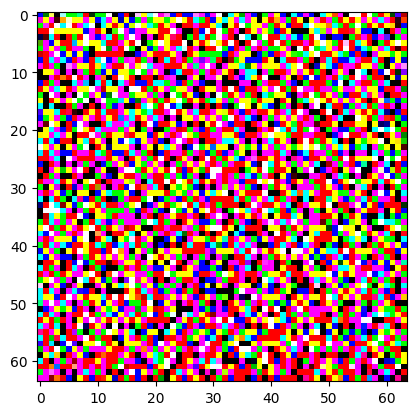

In [17]:
plt.imshow((generated_image[0, :, :, :] * 255 * 100))

## Discriminator layer
The discriminator is a CNN-based image classifier.

Inputs an image of dimension 64 x 64 x 3

Outputs a score between 0 and 1(sigmoid activation in final layer) Batch normalisation layer is applied for intermediate layers All the convolution-layer weights are initialized from a zero-centered normal distribution, with a standard deviation of 0.02 as per the original paper. Has Leaky-Relu (with a slope of 0.2) as an activation function in the intermediate layers along with dropout layers

Has a Sigmoid activation function in the output layer.Note that we can also leave the last layer without sigmoid activation and use_logits=True in Binary Cross entropy function(which is recommended but we have done it this way for ease in calculating real and fake scores with their display).

https://www.tensorflow.org/api_docs/python/tf/keras/layers/ZeroPadding2D

If tuple of 2 tuples of 2 ints: interpreted as ((top_pad, bottom_pad), (left_pad, right_pad))

In [18]:
def discriminator_model():
    model = tf.keras.Sequential()

    model.add(layers.Conv2D(32, kernel_size = 3, strides = 2, input_shape = (64, 64, 3), padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False ))
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(64, kernel_size = 3, strides = 2, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.ZeroPadding2D(padding = ((0, 1), (0, 1))))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.25))
    
    model.add(layers.Conv2D(128, kernel_size = 3, strides = 2, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))
    
    model.add(layers.Conv2D(256, kernel_size = 3, strides=1, padding = 'same',
                            kernel_initializer = init_weights_kernel, use_bias = False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha = 0.2))
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation = 'sigmoid'))

    return model

In [19]:
discriminator = discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 32)        864       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 32, 32, 32)        0         
                                                                 
 dropout (Dropout)           (None, 32, 32, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 64)        18432     
                                                                 
 zero_padding2d (ZeroPaddin  (None, 17, 17, 64)        0         
 g2D)                                                            
                                                                 
 batch_normalization_4 (Bat  (None, 17, 17, 64)        256       
 chNormalization)                                     

In [20]:
output = discriminator(generated_image)
print (output)

tf.Tensor([[0.50000125]], shape=(1, 1), dtype=float32)


## Loss functions
Now We are defining loss functions. In this case it is Binary Cross entropy as target is real or fake images

In [21]:
bce = tf.keras.losses.BinaryCrossentropy()

This method quantifies how well the discriminator is able to distinguish real images from fakes. It compares the discriminator's predictions on real images to an array of 1s, and the discriminator's predictions on fake (generated) images to an array of 0s.

In [22]:
def discriminator_loss(real_output, fake_output):
    real_loss = bce(tf.ones_like(real_output), real_output)
    fake_loss = bce(tf.zeros_like(fake_output), fake_output)

    total_loss = real_loss + fake_loss

    return total_loss

The generator's loss quantifies how well it was able to trick the discriminator. Intuitively, if the generator is performing well, the discriminator will classify the fake images as real (or 1). Here, compare the discriminators decisions on the generated images to an array of 1s.

In [23]:
def generator_loss(fake_output):
    gen_loss = bce(tf.ones_like(fake_output), fake_output)

    return gen_loss

The discriminator and the generator optimizers are different since two networks would be trained separately.Note that parameters are set as per 2016 paper- https://arxiv.org/pdf/1511.06434.pdf

In [24]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate = 0.0002, beta_1 = 0.5)

Following code demonstrates how to save and restore models, which can be helpful in case a long running training task is interrupted.

In [25]:
checkpoint_dir = './training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, 'ckpt')
checkpoint = tf.train.Checkpoint(generator_optimizer = generator_optimizer,
                                 discriminator_optimizer = discriminator_optimizer,
                                 generator = generator,
                                 discriminator = discriminator)

The training loop begins with generator receiving a random seed as input. That seed is used to produce an image. The discriminator is then used to classify real images (drawn from the training set) and fakes images (produced by the generator). The loss is calculated for each of these models, and the gradients are used to update the generator and discriminator.

We are using tf.function This annotation causes the function to be "compiled".

In [26]:
epochs = 50
noise_dim = 100
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [27]:
def generate_and_plot_images(model, epoch, test_input):
  
    predictions = model(test_input, training = False)

    fig = plt.figure(figsize = (8, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i + 1)  
        plt.imshow((predictions[i, :, :, :] * 0.5 + 0.5))
        plt.axis('off')

    plt.savefig('image_at_epoch_{:04d}.png'.format(epoch))
    plt.show()

In [28]:
@tf.function
def train_step(images):
    noise = tf.random.normal([batch_size, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training = True)

        real_output = discriminator(images, training = True)
        fake_output = discriminator(generated_images, training = True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
        
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return (gen_loss, disc_loss, tf.reduce_mean(real_output), tf.reduce_mean(fake_output))

In [29]:
def train(dataset, epochs):
    
    gen_loss_list = []
    disc_loss_list = []
    
    real_score_list = []
    fake_score_list = []

    for epoch in tqdm(range(epochs)):
        start = time.time()
        num_batches = len(dataset)
        
        print(f'Training started with  epoch {epoch + 1} with {num_batches} batches..')
        
        total_gen_loss = 0
        total_disc_loss = 0
        
        for batch in dataset:
            generator_loss, discriminator_loss, real_score, fake_score = train_step(batch)
            
            total_gen_loss += generator_loss
            total_disc_loss += discriminator_loss
        
        mean_gen_loss = total_gen_loss / num_batches
        mean_disc_loss = total_disc_loss / num_batches
           
        print('Losses after epoch %5d: generator %.3f, discriminator %.3f,\
               real_score %.2f%%, fake_score %.2f%%'  %
              (epoch+1, generator_loss, discriminator_loss, real_score * 100, fake_score * 100))

        generate_and_plot_images(generator, epoch + 1, seed)                 

        gen_loss_list.append(mean_gen_loss)
        disc_loss_list.append(mean_disc_loss)
        real_score_list.append(real_score)
        fake_score_list.append(fake_score)

        if (epoch + 1) % 10 == 0:
              checkpoint.save(file_prefix = checkpoint_prefix)

        print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))

  
    return  gen_loss_list, disc_loss_list, real_score_list, fake_score_list              


  0%|          | 0/50 [00:00<?, ?it/s]

Training started with  epoch 1 with 497 batches..
Losses after epoch     1: generator 1.962, discriminator 0.395,               real_score 98.41%, fake_score 25.78%


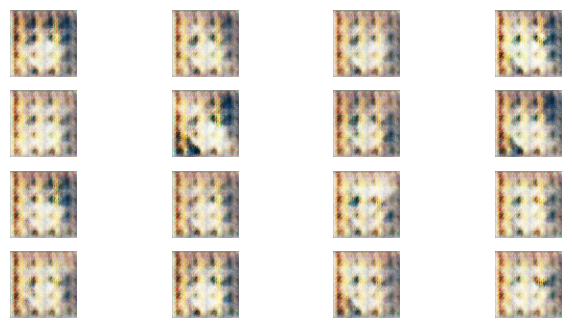

  2%|▏         | 1/50 [02:15<1:50:33, 135.38s/it]

Time for epoch 1 is 135.37574911117554 sec
Training started with  epoch 2 with 497 batches..
Losses after epoch     2: generator 6.676, discriminator 0.141,               real_score 92.68%, fake_score 2.15%


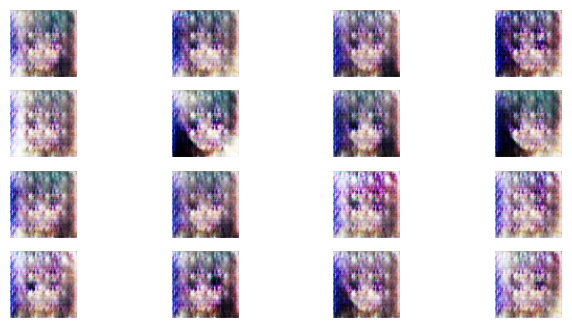

  4%|▍         | 2/50 [04:25<1:45:41, 132.11s/it]

Time for epoch 2 is 129.82482051849365 sec
Training started with  epoch 3 with 497 batches..
Losses after epoch     3: generator 3.102, discriminator 0.548,               real_score 86.92%, fake_score 18.65%


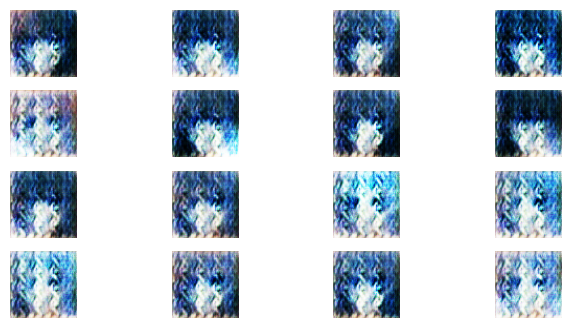

  6%|▌         | 3/50 [06:34<1:42:37, 131.01s/it]

Time for epoch 3 is 129.6878526210785 sec
Training started with  epoch 4 with 497 batches..
Losses after epoch     4: generator 4.072, discriminator 0.416,               real_score 79.73%, fake_score 6.25%


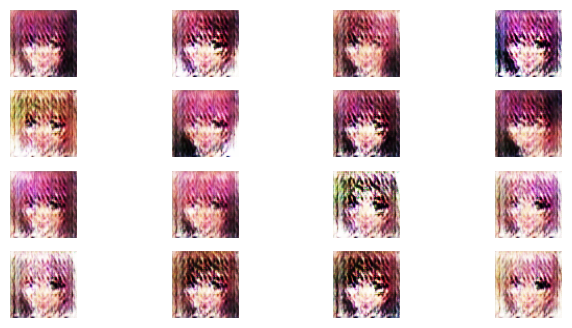

  8%|▊         | 4/50 [08:44<1:40:05, 130.55s/it]

Time for epoch 4 is 129.86164498329163 sec
Training started with  epoch 5 with 497 batches..
Losses after epoch     5: generator 4.759, discriminator 0.647,               real_score 71.08%, fake_score 5.05%


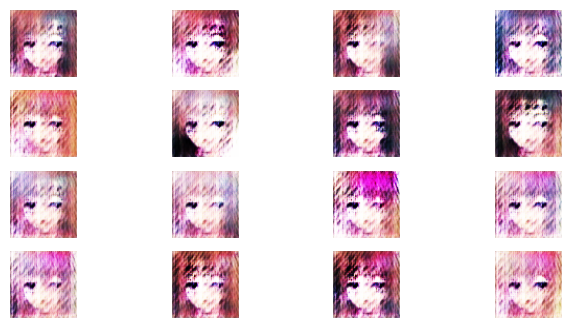

 10%|█         | 5/50 [10:55<1:37:51, 130.49s/it]

Time for epoch 5 is 130.36821246147156 sec
Training started with  epoch 6 with 497 batches..
Losses after epoch     6: generator 3.026, discriminator 0.285,               real_score 93.18%, fake_score 13.95%


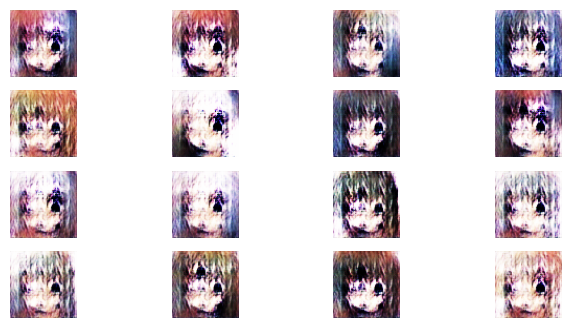

 12%|█▏        | 6/50 [13:05<1:35:34, 130.33s/it]

Time for epoch 6 is 130.0142138004303 sec
Training started with  epoch 7 with 497 batches..
Losses after epoch     7: generator 2.420, discriminator 0.434,               real_score 95.11%, fake_score 21.90%


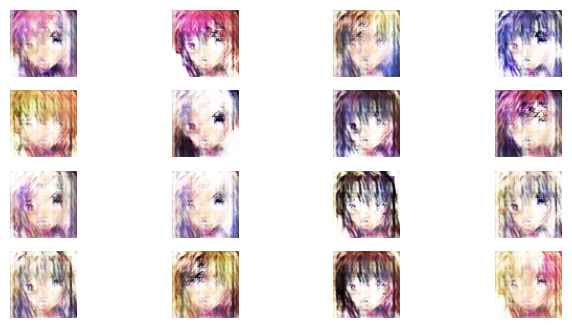

 14%|█▍        | 7/50 [15:15<1:33:23, 130.31s/it]

Time for epoch 7 is 130.26891660690308 sec
Training started with  epoch 8 with 497 batches..
Losses after epoch     8: generator 4.302, discriminator 0.743,               real_score 68.77%, fake_score 7.60%


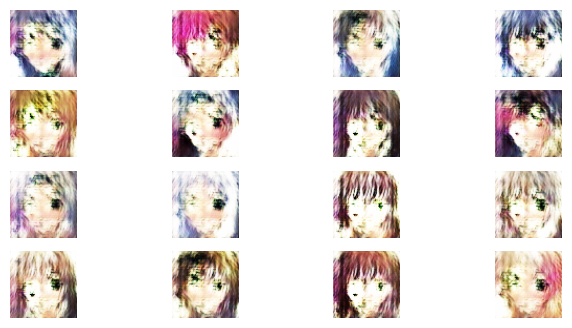

 16%|█▌        | 8/50 [17:25<1:31:13, 130.32s/it]

Time for epoch 8 is 130.33545804023743 sec
Training started with  epoch 9 with 497 batches..
Losses after epoch     9: generator 3.231, discriminator 0.394,               real_score 84.87%, fake_score 11.65%


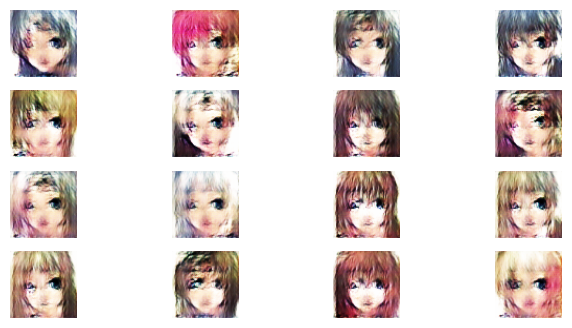

 18%|█▊        | 9/50 [19:36<1:29:11, 130.51s/it]

Time for epoch 9 is 130.93932104110718 sec
Training started with  epoch 10 with 497 batches..
Losses after epoch    10: generator 2.712, discriminator 0.350,               real_score 93.39%, fake_score 17.40%


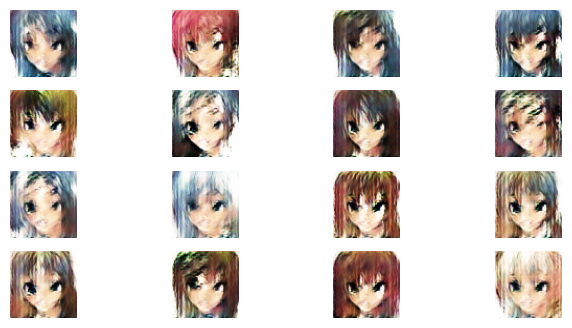

 20%|██        | 10/50 [21:48<1:27:13, 130.83s/it]

Time for epoch 10 is 131.53778910636902 sec
Training started with  epoch 11 with 497 batches..
Losses after epoch    11: generator 3.893, discriminator 0.427,               real_score 82.48%, fake_score 7.86%


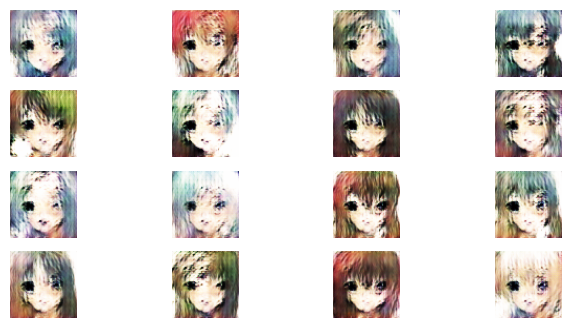

 22%|██▏       | 11/50 [23:59<1:25:06, 130.94s/it]

Time for epoch 11 is 131.1883625984192 sec
Training started with  epoch 12 with 497 batches..
Losses after epoch    12: generator 1.860, discriminator 0.540,               real_score 96.93%, fake_score 30.95%


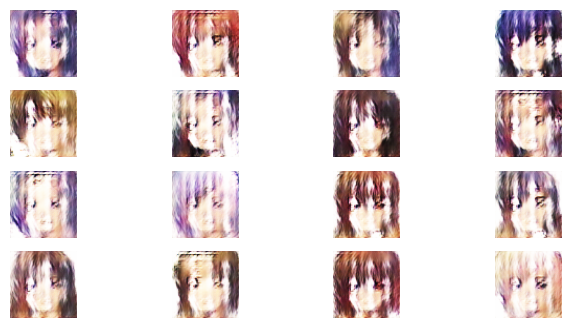

 24%|██▍       | 12/50 [26:10<1:22:56, 130.97s/it]

Time for epoch 12 is 131.0476574897766 sec
Training started with  epoch 13 with 497 batches..
Losses after epoch    13: generator 4.421, discriminator 0.236,               real_score 87.51%, fake_score 4.21%


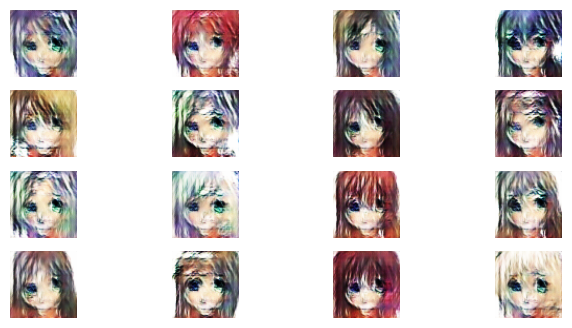

 26%|██▌       | 13/50 [28:22<1:20:57, 131.28s/it]

Time for epoch 13 is 132.00002717971802 sec
Training started with  epoch 14 with 497 batches..
Losses after epoch    14: generator 4.041, discriminator 0.192,               real_score 93.78%, fake_score 7.66%


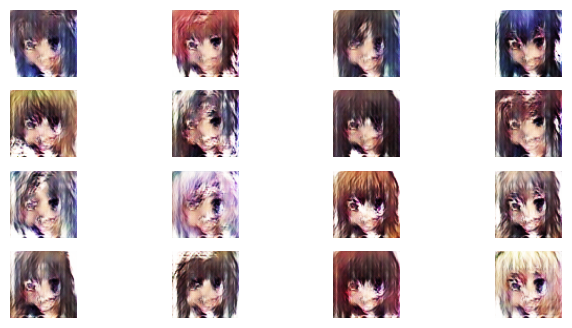

 28%|██▊       | 14/50 [30:33<1:18:38, 131.07s/it]

Time for epoch 14 is 130.56606674194336 sec
Training started with  epoch 15 with 497 batches..
Losses after epoch    15: generator 3.191, discriminator 0.433,               real_score 84.71%, fake_score 14.24%


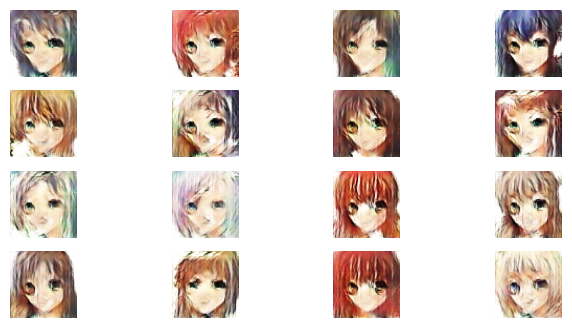

 30%|███       | 15/50 [32:43<1:16:20, 130.88s/it]

Time for epoch 15 is 130.43265008926392 sec
Training started with  epoch 16 with 497 batches..
Losses after epoch    16: generator 3.871, discriminator 0.468,               real_score 79.26%, fake_score 7.74%


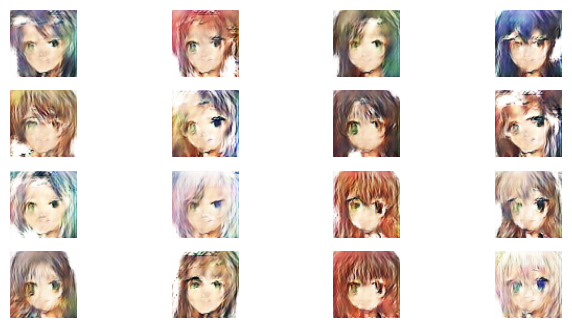

 32%|███▏      | 16/50 [34:54<1:14:06, 130.79s/it]

Time for epoch 16 is 130.57601952552795 sec
Training started with  epoch 17 with 497 batches..
Losses after epoch    17: generator 1.309, discriminator 0.903,               real_score 92.78%, fake_score 41.49%


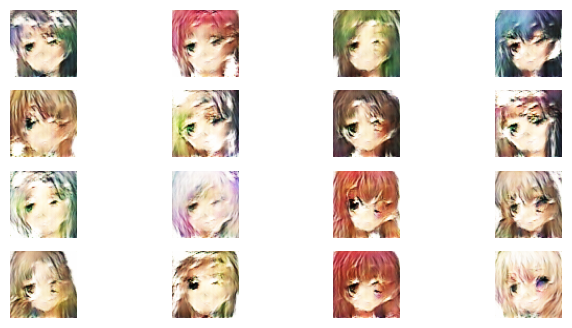

 34%|███▍      | 17/50 [37:04<1:11:56, 130.81s/it]

Time for epoch 17 is 130.87556719779968 sec
Training started with  epoch 18 with 497 batches..
Losses after epoch    18: generator 1.979, discriminator 0.464,               real_score 93.44%, fake_score 25.01%


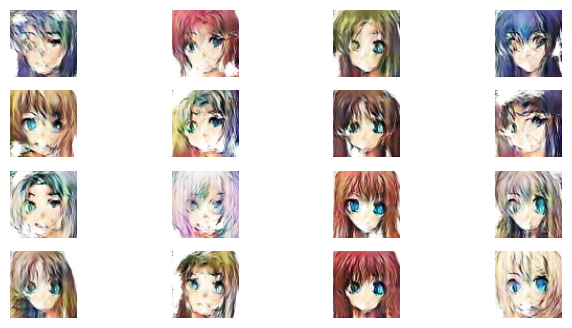

 36%|███▌      | 18/50 [39:15<1:09:42, 130.69s/it]

Time for epoch 18 is 130.40122985839844 sec
Training started with  epoch 19 with 497 batches..
Losses after epoch    19: generator 2.220, discriminator 0.513,               real_score 87.56%, fake_score 22.72%


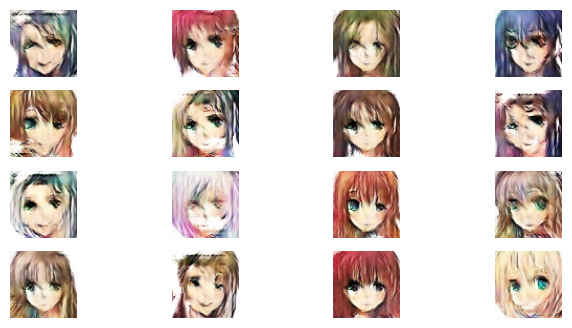

 38%|███▊      | 19/50 [41:25<1:07:25, 130.50s/it]

Time for epoch 19 is 130.06559467315674 sec
Training started with  epoch 20 with 497 batches..
Losses after epoch    20: generator 2.616, discriminator 0.341,               real_score 86.35%, fake_score 14.27%


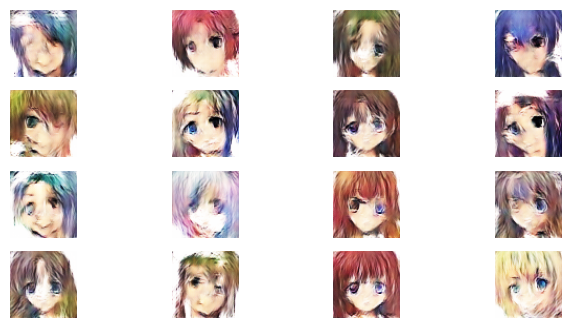

 40%|████      | 20/50 [43:35<1:05:15, 130.53s/it]

Time for epoch 20 is 130.58519101142883 sec
Training started with  epoch 21 with 497 batches..
Losses after epoch    21: generator 3.902, discriminator 0.542,               real_score 70.73%, fake_score 6.63%


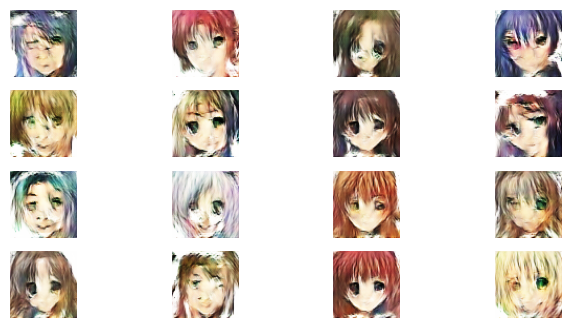

 42%|████▏     | 21/50 [45:46<1:03:01, 130.40s/it]

Time for epoch 21 is 130.09602785110474 sec
Training started with  epoch 22 with 497 batches..
Losses after epoch    22: generator 0.784, discriminator 1.323,               real_score 89.65%, fake_score 56.62%


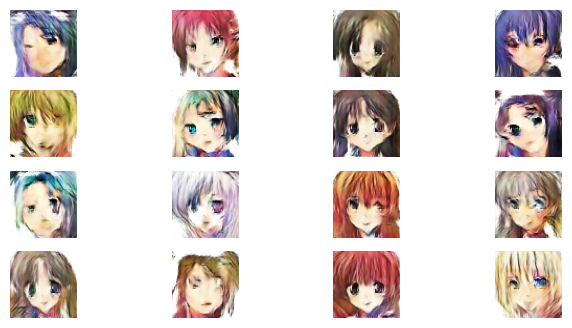

 44%|████▍     | 22/50 [47:56<1:00:51, 130.41s/it]

Time for epoch 22 is 130.450697183609 sec
Training started with  epoch 23 with 497 batches..
Losses after epoch    23: generator 4.218, discriminator 0.484,               real_score 72.61%, fake_score 5.94%


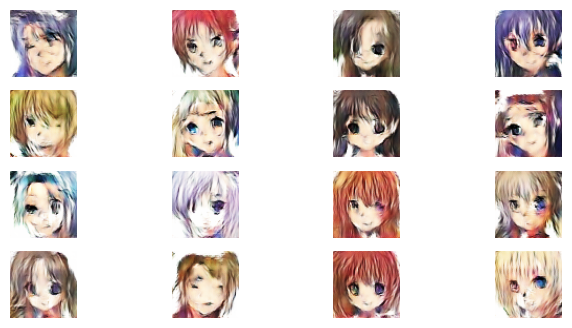

 46%|████▌     | 23/50 [50:06<58:38, 130.32s/it]  

Time for epoch 23 is 130.10055255889893 sec
Training started with  epoch 24 with 497 batches..
Losses after epoch    24: generator 3.511, discriminator 0.440,               real_score 75.76%, fake_score 7.48%


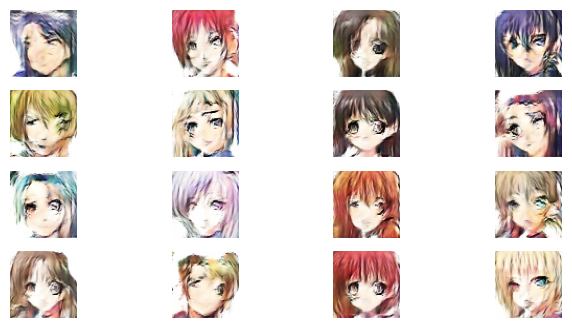

 48%|████▊     | 24/50 [52:17<56:31, 130.44s/it]

Time for epoch 24 is 130.72775077819824 sec
Training started with  epoch 25 with 497 batches..
Losses after epoch    25: generator 0.981, discriminator 1.082,               real_score 98.06%, fake_score 51.68%


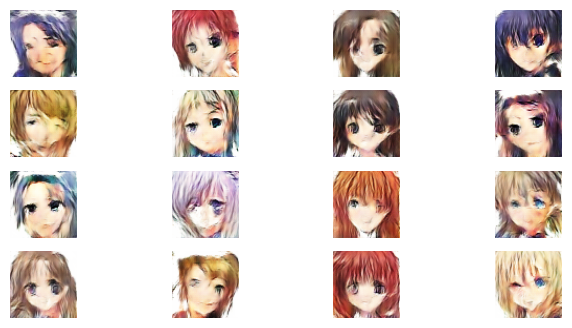

 50%|█████     | 25/50 [54:28<54:30, 130.80s/it]

Time for epoch 25 is 131.6316487789154 sec
Training started with  epoch 26 with 497 batches..
Losses after epoch    26: generator 2.257, discriminator 0.420,               real_score 90.33%, fake_score 20.54%


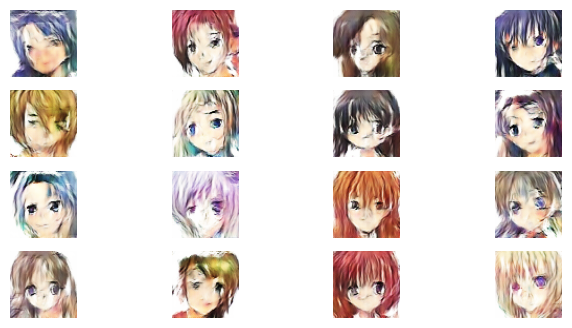

 52%|█████▏    | 26/50 [56:40<52:24, 131.01s/it]

Time for epoch 26 is 131.49131679534912 sec
Training started with  epoch 27 with 497 batches..
Losses after epoch    27: generator 1.943, discriminator 0.528,               real_score 89.46%, fake_score 25.09%


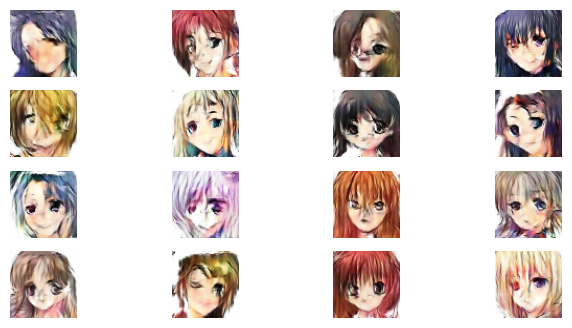

 54%|█████▍    | 27/50 [58:51<50:14, 131.08s/it]

Time for epoch 27 is 131.24692487716675 sec
Training started with  epoch 28 with 497 batches..
Losses after epoch    28: generator 3.466, discriminator 0.372,               real_score 83.27%, fake_score 8.83%


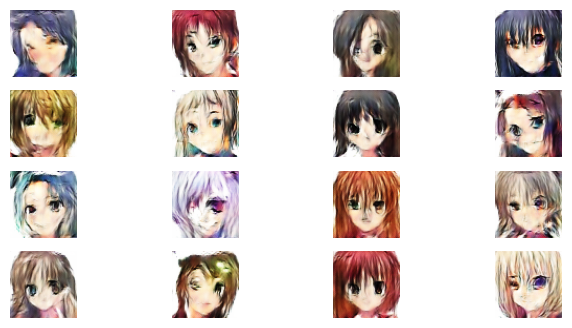

 56%|█████▌    | 28/50 [1:01:02<48:03, 131.06s/it]

Time for epoch 28 is 131.02309441566467 sec
Training started with  epoch 29 with 497 batches..
Losses after epoch    29: generator 2.161, discriminator 0.387,               real_score 91.75%, fake_score 21.06%


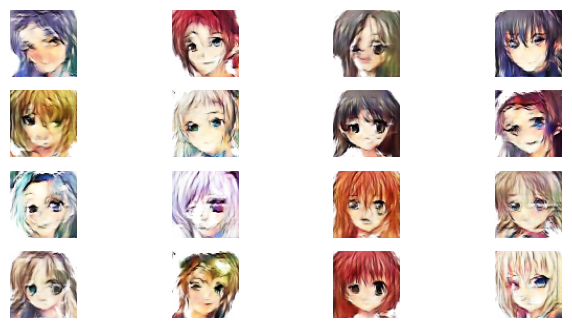

 58%|█████▊    | 29/50 [1:03:12<45:46, 130.78s/it]

Time for epoch 29 is 130.10777401924133 sec
Training started with  epoch 30 with 497 batches..
Losses after epoch    30: generator 3.513, discriminator 0.378,               real_score 80.21%, fake_score 8.11%


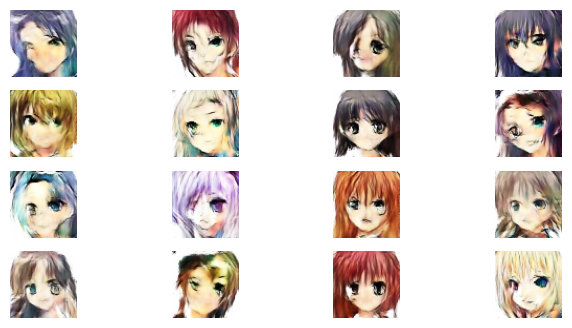

 60%|██████    | 30/50 [1:05:24<43:37, 130.89s/it]

Time for epoch 30 is 131.14389276504517 sec
Training started with  epoch 31 with 497 batches..
Losses after epoch    31: generator 2.122, discriminator 0.529,               real_score 87.29%, fake_score 23.66%


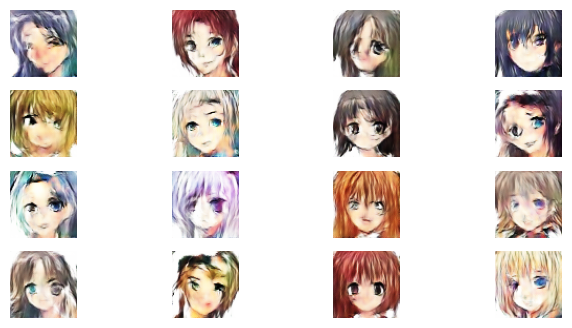

 62%|██████▏   | 31/50 [1:07:34<41:26, 130.88s/it]

Time for epoch 31 is 130.8570201396942 sec
Training started with  epoch 32 with 497 batches..
Losses after epoch    32: generator 2.801, discriminator 0.366,               real_score 85.79%, fake_score 13.65%


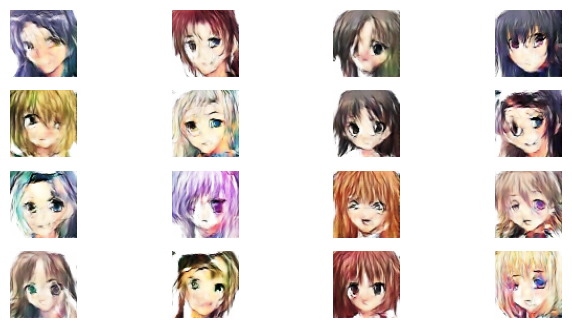

 64%|██████▍   | 32/50 [1:09:45<39:12, 130.68s/it]

Time for epoch 32 is 130.22037768363953 sec
Training started with  epoch 33 with 497 batches..
Losses after epoch    33: generator 1.835, discriminator 0.438,               real_score 95.02%, fake_score 27.04%


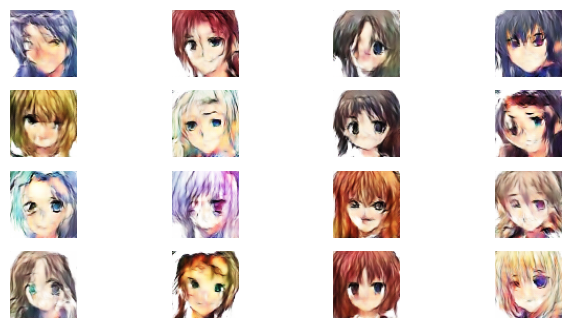

 66%|██████▌   | 33/50 [1:11:55<36:59, 130.54s/it]

Time for epoch 33 is 130.21907424926758 sec
Training started with  epoch 34 with 497 batches..
Losses after epoch    34: generator 2.656, discriminator 0.230,               real_score 96.77%, fake_score 15.41%


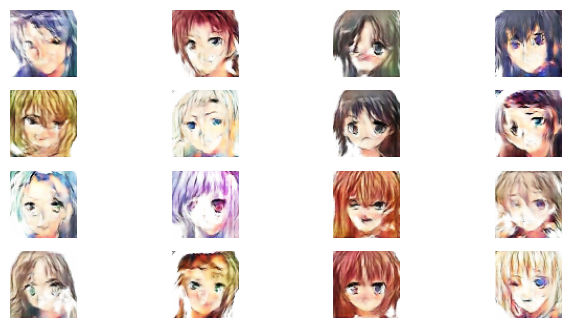

 68%|██████▊   | 34/50 [1:14:05<34:46, 130.39s/it]

Time for epoch 34 is 130.01698446273804 sec
Training started with  epoch 35 with 497 batches..
Losses after epoch    35: generator 4.241, discriminator 0.437,               real_score 78.18%, fake_score 5.73%


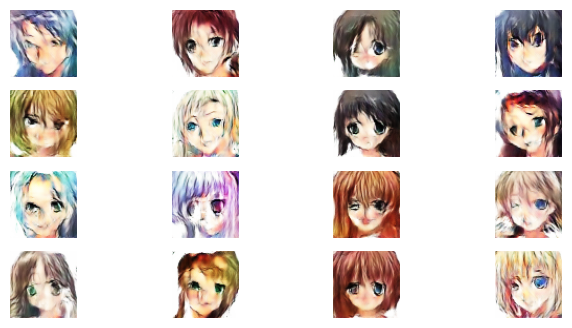

 70%|███████   | 35/50 [1:16:15<32:33, 130.26s/it]

Time for epoch 35 is 129.96750140190125 sec
Training started with  epoch 36 with 497 batches..
Losses after epoch    36: generator 1.653, discriminator 0.628,               real_score 97.84%, fake_score 33.54%


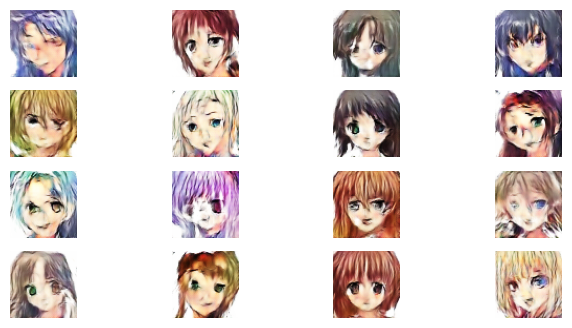

 72%|███████▏  | 36/50 [1:18:25<30:23, 130.22s/it]

Time for epoch 36 is 130.10806226730347 sec
Training started with  epoch 37 with 497 batches..
Losses after epoch    37: generator 4.456, discriminator 0.300,               real_score 82.13%, fake_score 3.94%


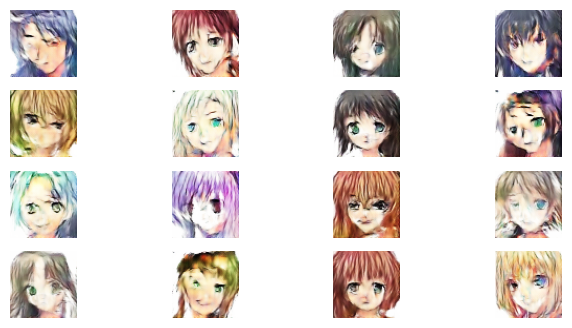

 74%|███████▍  | 37/50 [1:20:35<28:13, 130.27s/it]

Time for epoch 37 is 130.40203833580017 sec
Training started with  epoch 38 with 497 batches..
Losses after epoch    38: generator 2.524, discriminator 0.255,               real_score 97.89%, fake_score 17.12%


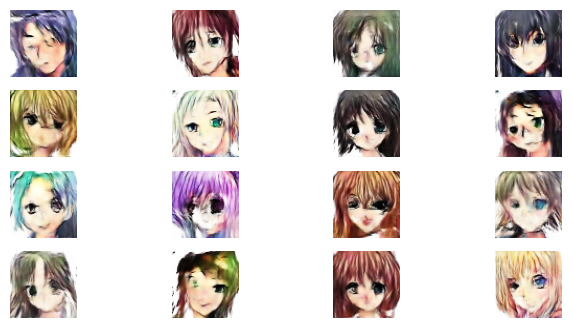

 76%|███████▌  | 38/50 [1:22:46<26:05, 130.46s/it]

Time for epoch 38 is 130.9057276248932 sec
Training started with  epoch 39 with 497 batches..
Losses after epoch    39: generator 2.852, discriminator 0.676,               real_score 72.96%, fake_score 15.19%


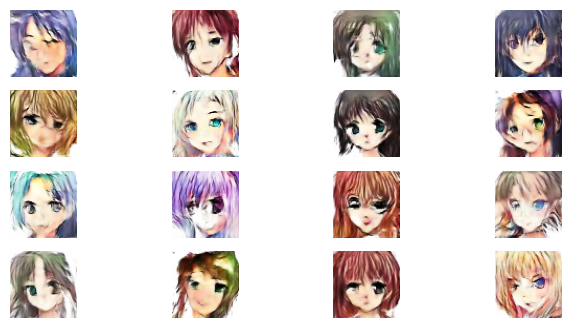

 78%|███████▊  | 39/50 [1:24:57<23:55, 130.52s/it]

Time for epoch 39 is 130.65134453773499 sec
Training started with  epoch 40 with 497 batches..
Losses after epoch    40: generator 2.256, discriminator 0.346,               real_score 97.81%, fake_score 21.69%


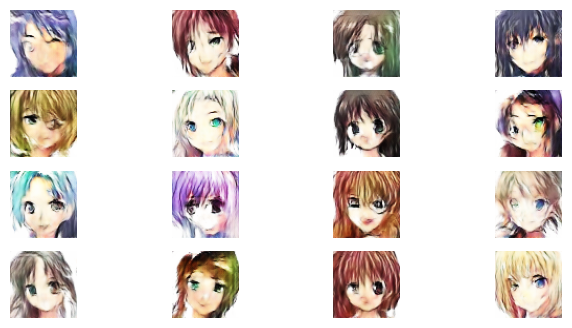

 80%|████████  | 40/50 [1:27:08<21:47, 130.75s/it]

Time for epoch 40 is 131.28798604011536 sec
Training started with  epoch 41 with 497 batches..
Losses after epoch    41: generator 5.534, discriminator 0.499,               real_score 70.07%, fake_score 1.96%


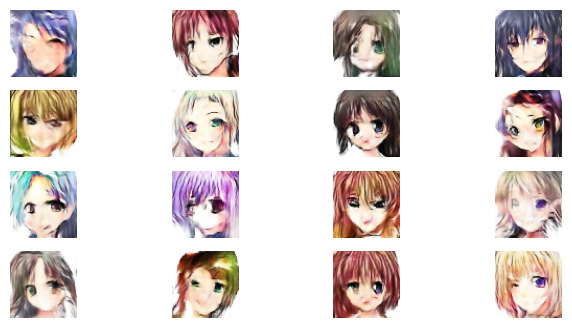

 82%|████████▏ | 41/50 [1:29:18<19:35, 130.60s/it]

Time for epoch 41 is 130.25855326652527 sec
Training started with  epoch 42 with 497 batches..
Losses after epoch    42: generator 2.496, discriminator 0.664,               real_score 73.72%, fake_score 19.04%


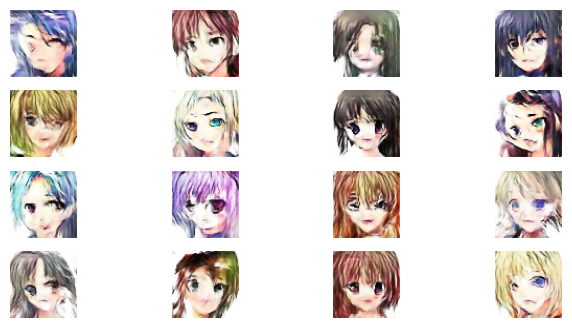

 84%|████████▍ | 42/50 [1:31:29<17:23, 130.50s/it]

Time for epoch 42 is 130.25323462486267 sec
Training started with  epoch 43 with 497 batches..
Losses after epoch    43: generator 3.266, discriminator 0.150,               real_score 98.84%, fake_score 10.82%


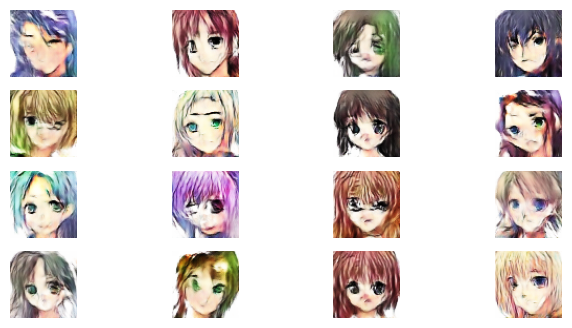

 86%|████████▌ | 43/50 [1:33:39<15:13, 130.51s/it]

Time for epoch 43 is 130.53378701210022 sec
Training started with  epoch 44 with 497 batches..
Losses after epoch    44: generator 2.443, discriminator 0.306,               real_score 96.63%, fake_score 18.39%


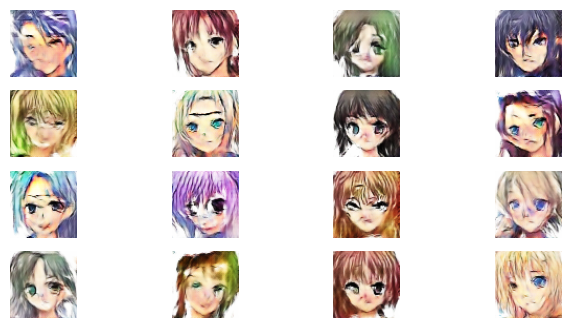

 88%|████████▊ | 44/50 [1:35:49<13:01, 130.32s/it]

Time for epoch 44 is 129.87753820419312 sec
Training started with  epoch 45 with 497 batches..
Losses after epoch    45: generator 2.205, discriminator 0.355,               real_score 93.92%, fake_score 20.84%


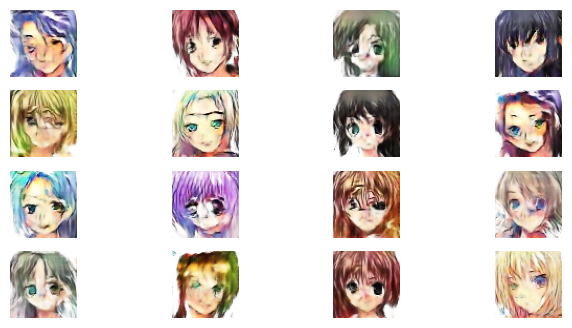

 90%|█████████ | 45/50 [1:37:59<10:50, 130.18s/it]

Time for epoch 45 is 129.8498890399933 sec
Training started with  epoch 46 with 497 batches..
Losses after epoch    46: generator 4.869, discriminator 1.443,               real_score 37.42%, fake_score 3.15%


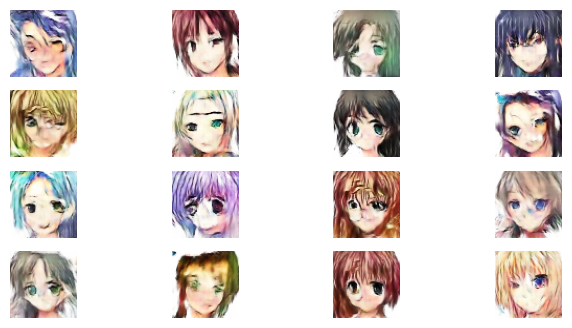

 92%|█████████▏| 46/50 [1:40:09<08:40, 130.09s/it]

Time for epoch 46 is 129.88452172279358 sec
Training started with  epoch 47 with 497 batches..
Losses after epoch    47: generator 7.778, discriminator 1.149,               real_score 48.21%, fake_score 0.21%


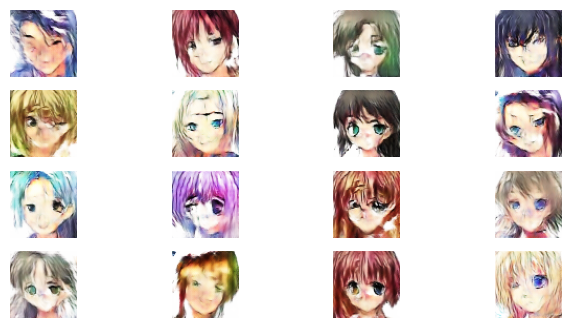

 94%|█████████▍| 47/50 [1:42:19<06:30, 130.09s/it]

Time for epoch 47 is 130.07088208198547 sec
Training started with  epoch 48 with 497 batches..
Losses after epoch    48: generator 4.360, discriminator 0.103,               real_score 94.71%, fake_score 4.02%


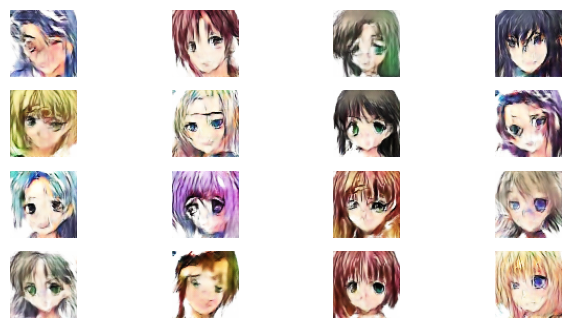

 96%|█████████▌| 48/50 [1:44:29<04:20, 130.00s/it]

Time for epoch 48 is 129.80964398384094 sec
Training started with  epoch 49 with 497 batches..
Losses after epoch    49: generator 3.644, discriminator 0.187,               real_score 93.73%, fake_score 8.67%


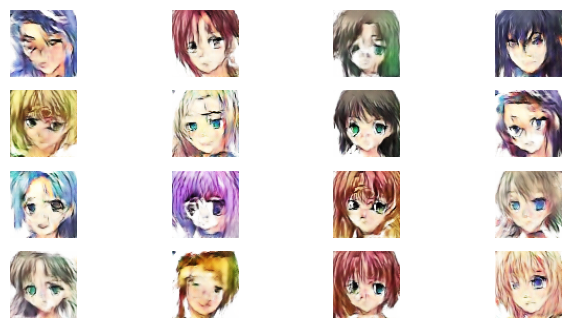

 98%|█████████▊| 49/50 [1:46:38<02:09, 129.92s/it]

Time for epoch 49 is 129.7246515750885 sec
Training started with  epoch 50 with 497 batches..
Losses after epoch    50: generator 2.311, discriminator 0.319,               real_score 97.96%, fake_score 20.23%


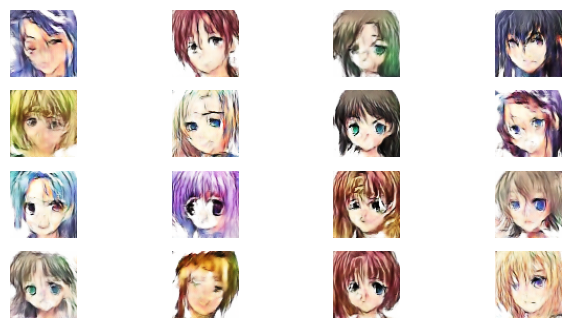

100%|██████████| 50/50 [1:48:49<00:00, 130.60s/it]

Time for epoch 50 is 130.9546480178833 sec


In [30]:
gen_loss_epochs, disc_loss_epochs, real_score_list, fake_score_list = train(train_dataset, epochs = epochs)

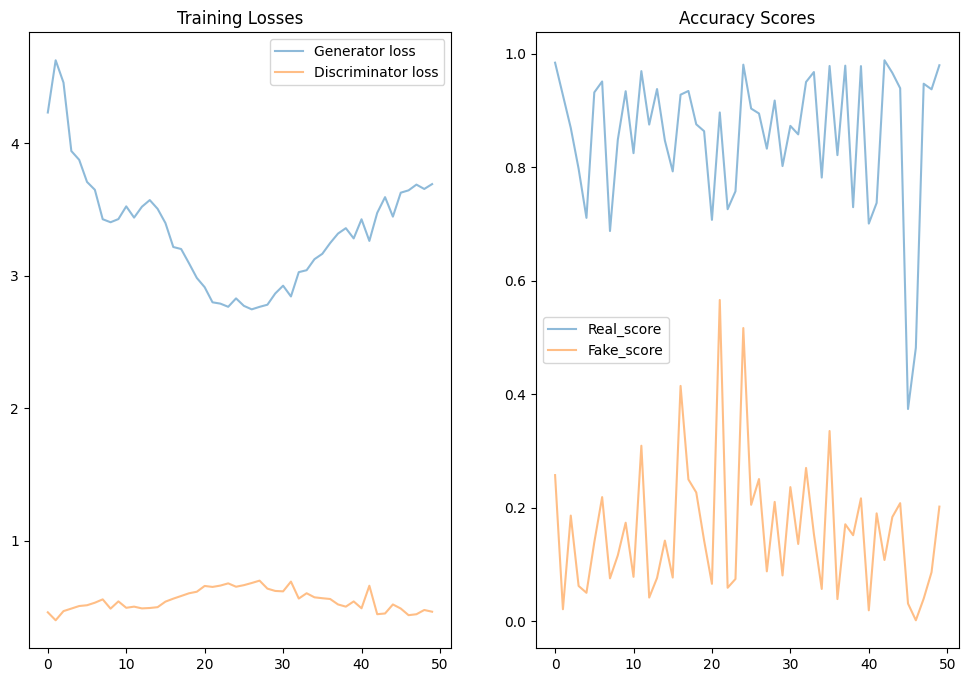

In [31]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize = (12, 8))

ax1.plot(gen_loss_epochs, label = 'Generator loss', alpha = 0.5)
ax1.plot(disc_loss_epochs, label = 'Discriminator loss', alpha = 0.5)
ax1.legend()
ax1.set_title('Training Losses')

ax2.plot(real_score_list, label = 'Real_score', alpha = 0.5)
ax2.plot(fake_score_list, label = 'Fake_score', alpha = 0.5)
ax2.set_title('Accuracy Scores')

ax2.legend()